Number of points within USA bounds: 28809800


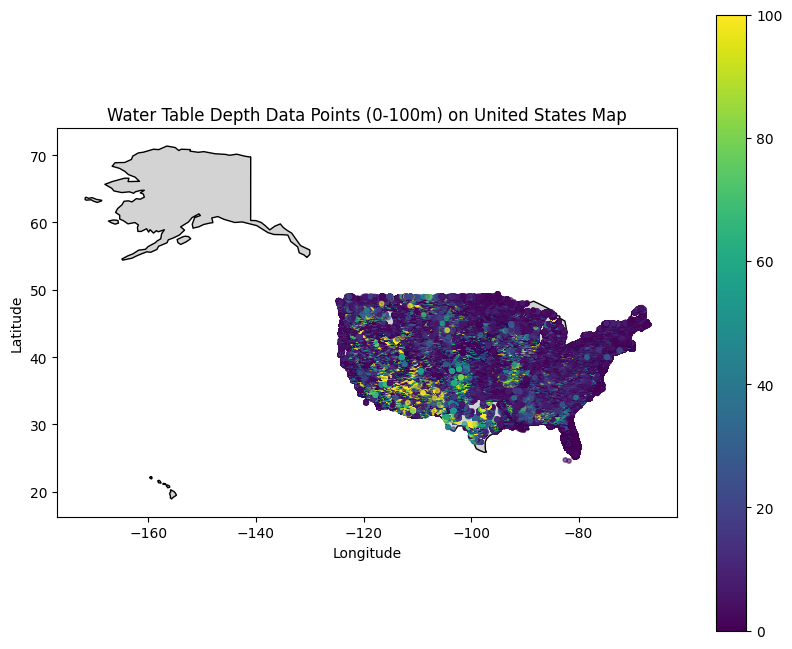

In [19]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point

# Step 1: Load CSV Data
file_path = r'C:\Users\rubab\Desktop\GWE_codes\WaterTable_dataUSGS\df_all_USGS.csv'
data = pd.read_csv(file_path)

# Step 2: Validate and Prepare Data Columns
depth_column_name = 'wtd'
if 'latitude' not in data.columns or 'longitude' not in data.columns:
    raise KeyError("CSV file must contain 'latitude' and 'longitude' columns.")
if depth_column_name not in data.columns:
    raise KeyError(f"CSV file must contain a '{depth_column_name}' column.")

# Step 3: Convert DataFrame to GeoDataFrame with Geometry Column
data['geometry'] = data.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)
gdf = gpd.GeoDataFrame(data, geometry='geometry', crs='EPSG:4326')  # WGS84 for lat/lon data

# Step 4: Load the Natural Earth Shapefile for World Countries
shapefile_path = r'C:\Users\rubab\Desktop\GWE_codes\WaterTable_dataUSGS\ne_110m_admin_0_countries\ne_110m_admin_0_countries.shp'  # Adjust to your path
world = gpd.read_file(shapefile_path)

# Filter to get only the United States
usa = world[world['ADMIN'] == 'United States of America']  # Use the correct column name

# Step 5: Check if Geometry Points Are Created Correctly and Within Bounds
usa_bounds = usa.total_bounds  # [minx, miny, maxx, maxy]
points_within_bounds = gdf[
    gdf['geometry'].x.between(usa_bounds[0], usa_bounds[2]) &
    gdf['geometry'].y.between(usa_bounds[1], usa_bounds[3])
]
print(f"Number of points within USA bounds: {len(points_within_bounds)}")

# Step 6: Plotting
fig, ax = plt.subplots(figsize=(10, 8))
usa.plot(ax=ax, color='lightgrey', edgecolor='black')  # Plot the USA map

# Plot points over the USA map, setting depth range to 0-100 meters
scatter = points_within_bounds.plot(
    ax=ax,
    markersize=10,
    column=depth_column_name,
    cmap='viridis',        # Color map for depth values
    vmin=0,                # Minimum depth value
    vmax=100,              # Maximum depth value
    legend=True,
    alpha=0.6
)

# Title and Labels
plt.title('Water Table Depth Data Points (0-100m) on United States Map')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()



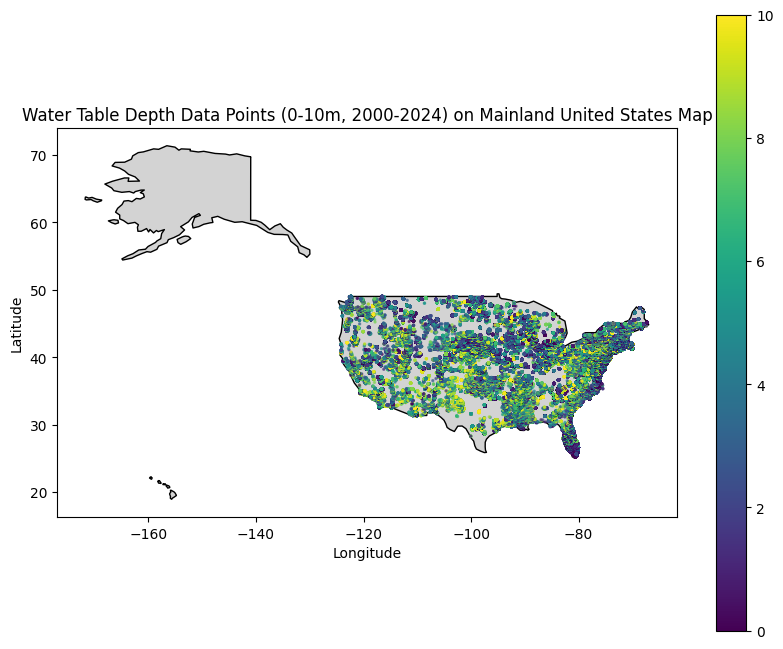

In [29]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point

# Step 1: Load CSV Data
file_path = r'C:\Users\rubab\Desktop\GWE_codes\WaterTable_dataUSGS\df_all_USGS.csv'
data = pd.read_csv(file_path)

# Step 2: Validate and Prepare Data Columns
depth_column_name = 'wtd'
if 'latitude' not in data.columns or 'longitude' not in data.columns:
    raise KeyError("CSV file must contain 'latitude' and 'longitude' columns.")
if depth_column_name not in data.columns:
    raise KeyError(f"CSV file must contain a '{depth_column_name}' column.")
if 'date' not in data.columns:
    raise KeyError("CSV file must contain a 'date' column.")

# Step 3: Filter Data for Depth and Date Range
data['date'] = pd.to_datetime(data['date'], errors='coerce')
filtered_data = data[(data[depth_column_name] >= 0) &
                     (data[depth_column_name] <= 10) &
                     (data['date'].dt.year >= 2000) &
                     (data['date'].dt.year <= 2024)]

# Check if there are any points to plot
if filtered_data.empty:
    print("No data points found with a depth between 0 and 10 meters between 2000 and 2024.")
else:
    # Step 4: Convert Filtered DataFrame to GeoDataFrame with Geometry Column
    filtered_data = filtered_data.copy()  # Avoid SettingWithCopyWarning
    filtered_data['geometry'] = filtered_data.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)
    gdf = gpd.GeoDataFrame(filtered_data, geometry='geometry', crs='EPSG:4326')  # WGS84 for lat/lon data

    # Step 5: Load the Natural Earth Shapefile for World Countries
    shapefile_path = r'C:\Users\rubab\Desktop\GWE_codes\WaterTable_dataUSGS\ne_110m_admin_0_countries\ne_110m_admin_0_countries.shp'  # Correct path
    world = gpd.read_file(shapefile_path)

    # Filter to get only the United States
    usa = world[world['ADMIN'] == 'United States of America']  # Filter to U.S. geometry

    # Step 6: Exclude Alaska and Hawaii by using a bounding box for the contiguous U.S.
    contiguous_usa = usa.cx[-125:-66, 24.5:49.5]

    # Step 7: Plotting
    fig, ax = plt.subplots(figsize=(10, 8))
    contiguous_usa.plot(ax=ax, color='lightgrey', edgecolor='black')  # Plot the mainland USA map

    # Plot points over the contiguous USA map
    scatter = gdf.plot(
        ax=ax,
        markersize=2,
        column=depth_column_name,  # Color points based on water table depth
        cmap='viridis',            # Color map for depth values
        vmin=0,                     # Minimum depth value
        vmax=10,                    # Maximum depth value
        legend=True,
        alpha=0.6
    )

    # Title and Labels
    plt.title('Water Table Depth Data Points (0-10m, 2000-2024) on Mainland United States Map')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.show()


In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point, Polygon, MultiPolygon

# Step 1: Load CSV Data
file_path = r'C:\Users\rubab\Desktop\GWE_codes\WaterTable_dataUSGS\df_all_USGS.csv'
data = pd.read_csv(file_path)

# Step 2: Validate and Prepare Data Columns
depth_column_name = 'wtd'
if 'latitude' not in data.columns or 'longitude' not in data.columns:
    raise KeyError("CSV file must contain 'latitude' and 'longitude' columns.")
if depth_column_name not in data.columns:
    raise KeyError(f"CSV file must contain a '{depth_column_name}' column.")
if 'date' not in data.columns:
    raise KeyError("CSV file must contain a 'date' column.")

# Step 3: Filter Data for Depth and Date Range
data['date'] = pd.to_datetime(data['date'], errors='coerce')
filtered_data = data[(data[depth_column_name] >= 0) &
                     (data[depth_column_name] <= 10) &
                     (data['date'].dt.year >= 2000) &
                     (data['date'].dt.year <= 2024)]

# Check if there are any points to plot
if filtered_data.empty:
    print("No data points found with a depth between 0 and 10 meters between 2000 and 2024.")
else:
    # Step 4: Convert Filtered DataFrame to GeoDataFrame with Geometry Column
    filtered_data = filtered_data.copy()  # Avoid SettingWithCopyWarning
    filtered_data['geometry'] = filtered_data.apply(lambda row: Point(row['longitude'], row['latitude']), axis=1)
    gdf = gpd.GeoDataFrame(filtered_data, geometry='geometry', crs='EPSG:4326')  # WGS84 for lat/lon data

    # Step 5: Load the Natural Earth Shapefile for World Countries
    shapefile_path = r'C:\Users\rubab\Desktop\GWE_codes\WaterTable_dataUSGS\ne_110m_admin_0_countries\ne_110m_admin_0_countries.shp'  # Correct path
    world = gpd.read_file(shapefile_path)

    # Filter to get only the United States
    usa = world[world['ADMIN'] == 'United States of America']

    # Step 6: Reproject to a suitable projected CRS for area calculation (e.g., EPSG:5070)
    usa = usa.to_crs('EPSG:5070')

    # Explode into individual polygons, keep only Polygon/MultiPolygon geometries, and union them
    usa_exploded = usa.explode(index_parts=False)
    usa_exploded = usa_exploded[usa_exploded.geometry.apply(lambda x: isinstance(x, (Polygon, MultiPolygon)))]

    # Select the largest polygon based on area and use union_all() instead of unary_union
    largest_polygon = usa_exploded.geometry.union_all()

    # Convert back to a GeoDataFrame and reproject to EPSG:4326 for display
    mainland_usa = gpd.GeoDataFrame(geometry=[largest_polygon], crs=usa.crs).to_crs('EPSG:4326')

    # Step 7: Plotting
    fig, ax = plt.subplots(figsize=(10, 8))
    mainland_usa.plot(ax=ax, color='lightgrey', edgecolor='black')  # Plot the mainland USA map

    # Plot points over the contiguous USA map
    scatter = gdf.plot(
        ax=ax,
        markersize=2,
        column=depth_column_name,  # Color points based on water table depth
        cmap='viridis',            # Color map for depth values
        vmin=0,                     # Minimum depth value
        vmax=10,                    # Maximum depth value
        legend=True,
        alpha=0.6
    )

    # Title and Labels
    plt.title('Water Table Depth Data Points (0-10m, 2000-2024) on Mainland United States Map')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.show()


Checking path for AL: C:\Users\rubab\Desktop\GWE_codes\WetalandData\AL\AL_geodatabase_Wetlands.gdb


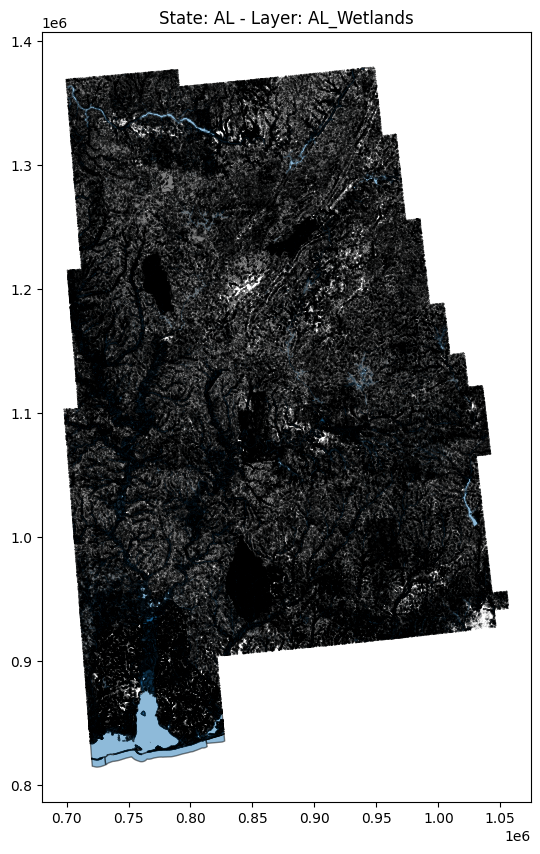

Checking path for AR: C:\Users\rubab\Desktop\GWE_codes\WetalandData\AR\AR_geodatabase_Wetlands.gdb


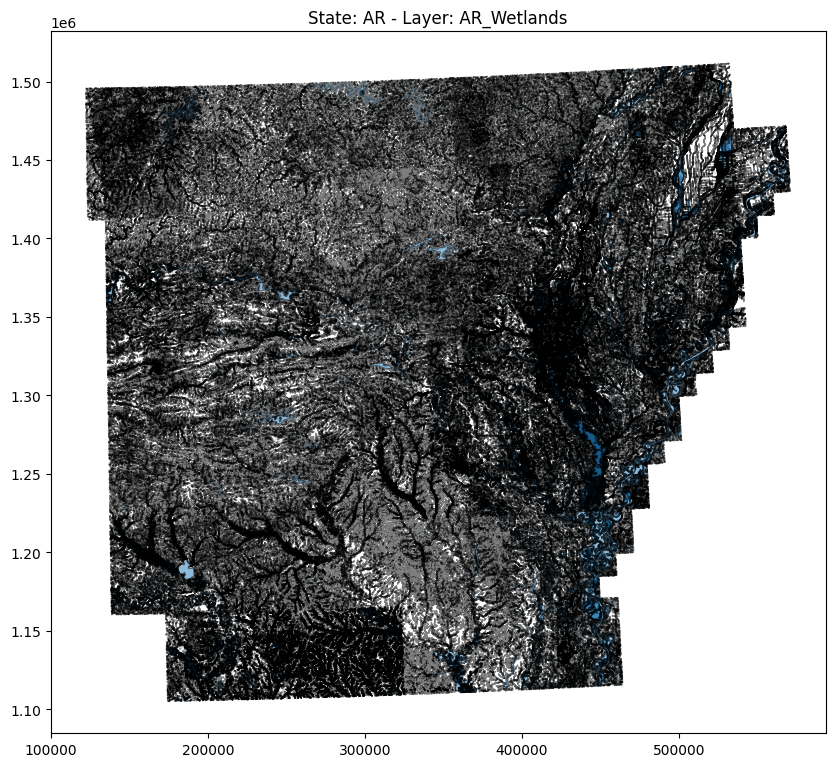

Checking path for AZ: C:\Users\rubab\Desktop\GWE_codes\WetalandData\AZ\AZ_geodatabase_Wetlands.gdb


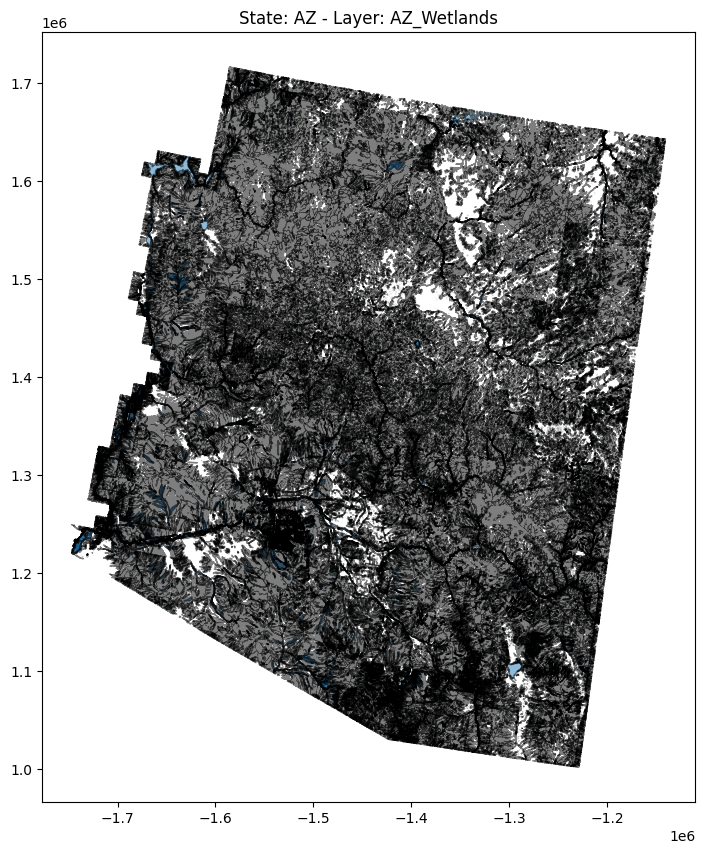

Checking path for CO: C:\Users\rubab\Desktop\GWE_codes\WetalandData\CO\CO_geodatabase_Wetlands.gdb


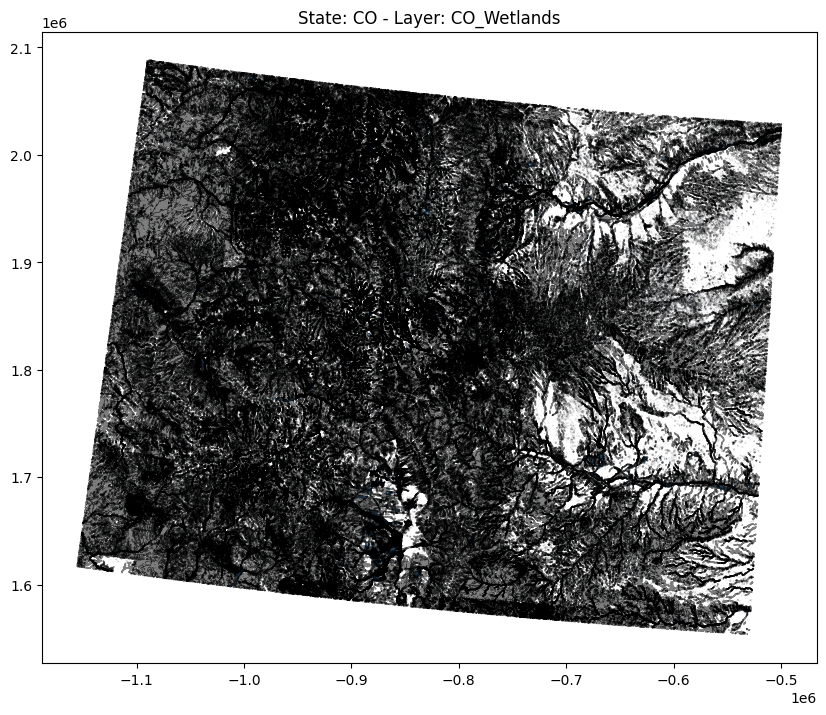

Checking path for CT: C:\Users\rubab\Desktop\GWE_codes\WetalandData\CT\CT_geodatabase_Wetlands.gdb


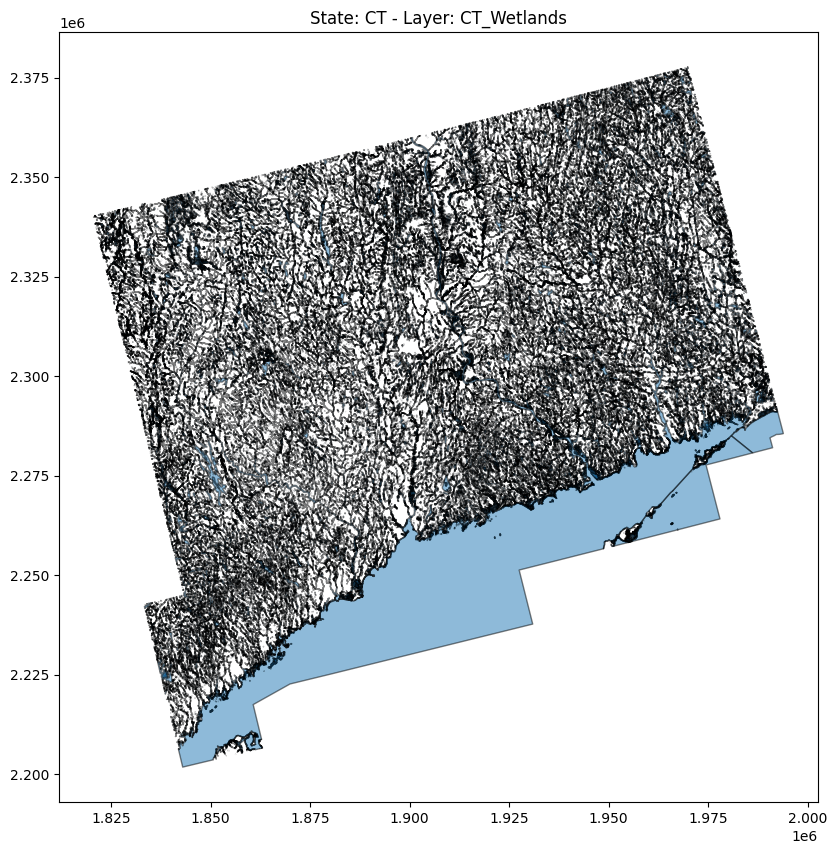

Checking path for DC: C:\Users\rubab\Desktop\GWE_codes\WetalandData\DC\DC_geodatabase_Wetlands.gdb


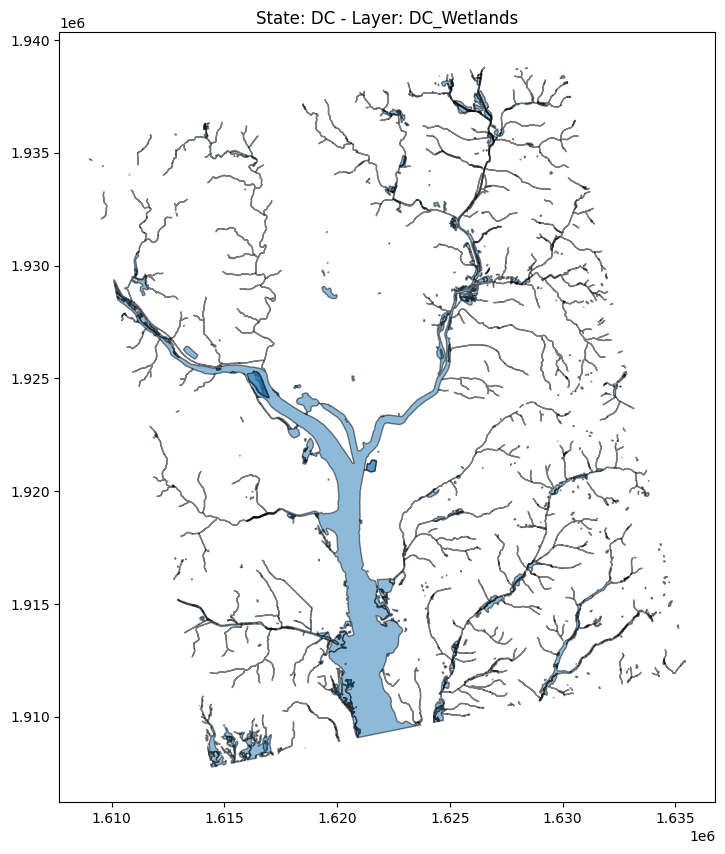

Checking path for DE: C:\Users\rubab\Desktop\GWE_codes\WetalandData\DE\DE_geodatabase_Wetlands.gdb


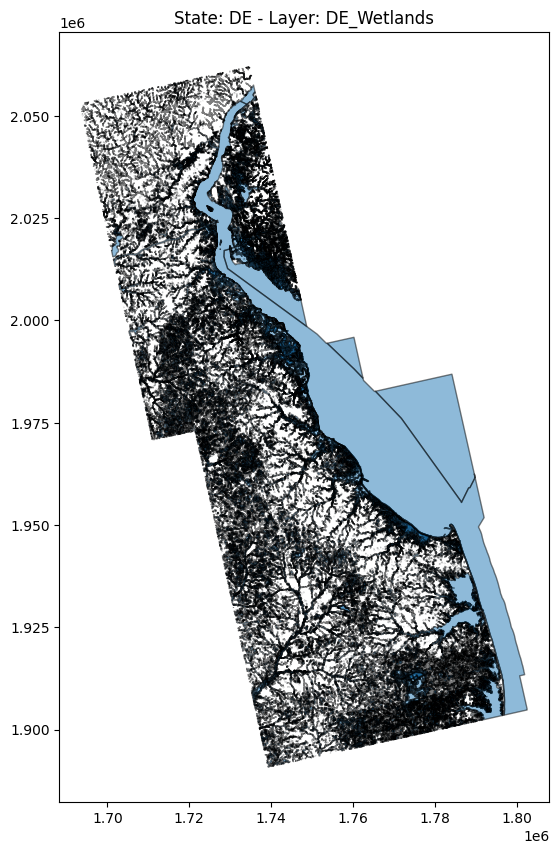

Checking path for IA: C:\Users\rubab\Desktop\GWE_codes\WetalandData\IA\IA_geodatabase_Wetlands.gdb


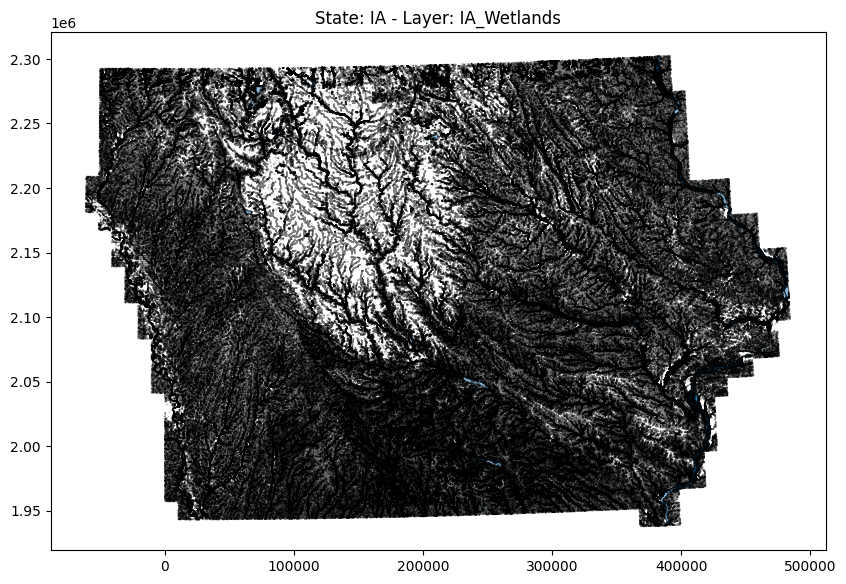

Checking path for ID: C:\Users\rubab\Desktop\GWE_codes\WetalandData\ID\ID_geodatabase_Wetlands.gdb


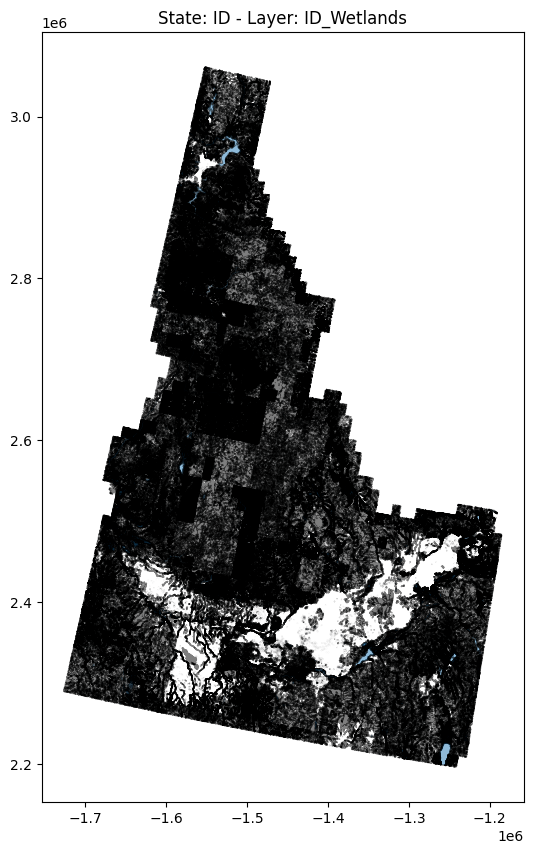

Checking path for IL: C:\Users\rubab\Desktop\GWE_codes\WetalandData\IL\IL_geodatabase_Wetlands.gdb


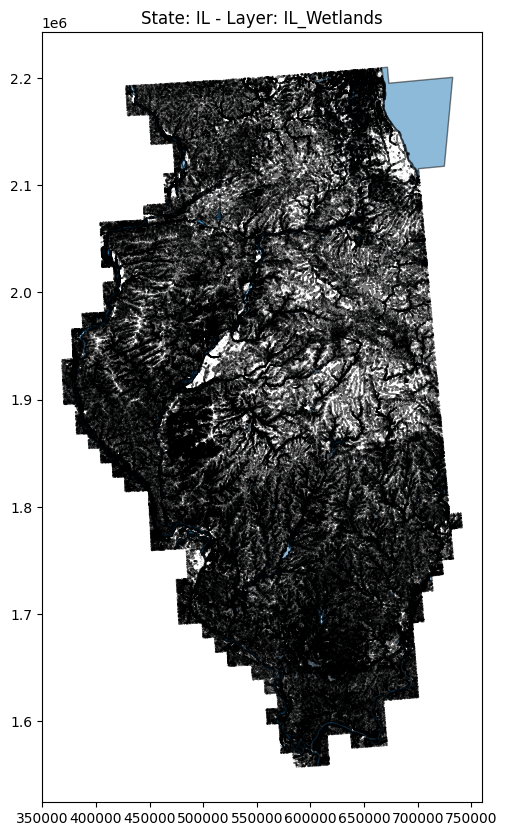

Checking path for IN: C:\Users\rubab\Desktop\GWE_codes\WetalandData\IN\IN_geodatabase_Wetlands.gdb


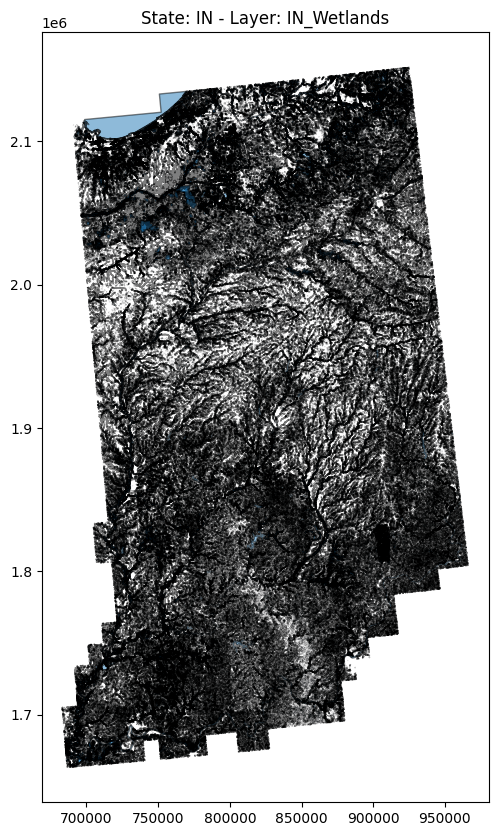

Checking path for KS: C:\Users\rubab\Desktop\GWE_codes\WetalandData\KS\KS_geodatabase_Wetlands.gdb


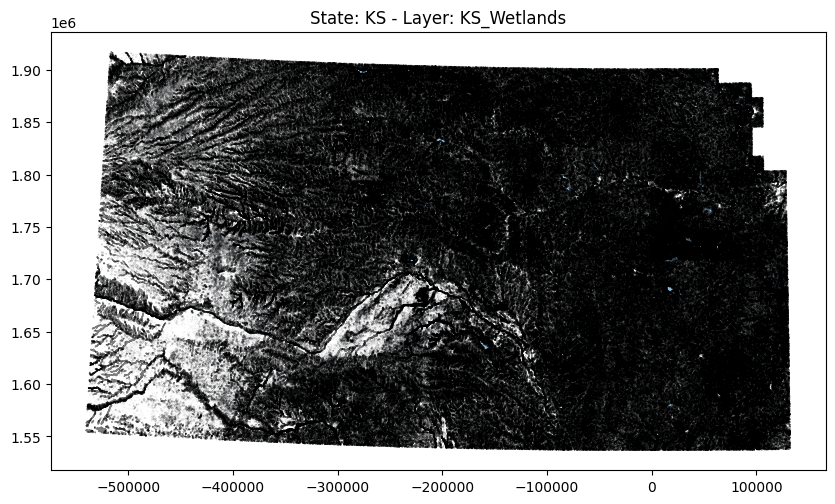

Checking path for KY: C:\Users\rubab\Desktop\GWE_codes\WetalandData\KY\KY_geodatabase_Wetlands.gdb


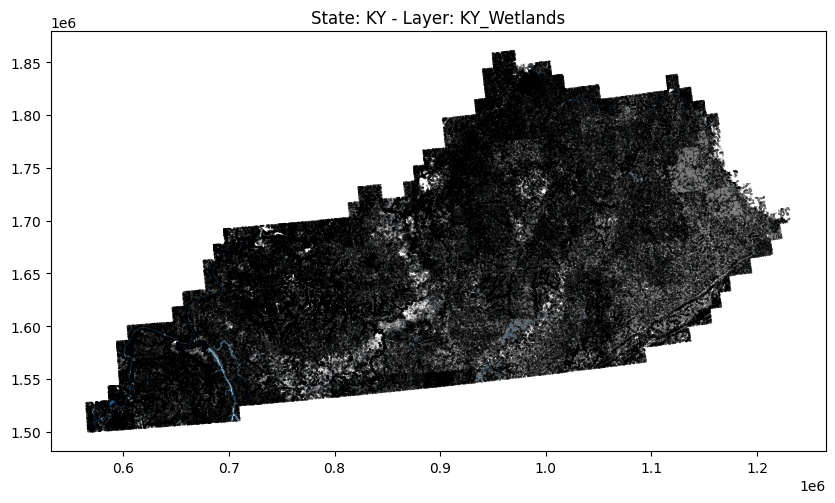

Checking path for LA: C:\Users\rubab\Desktop\GWE_codes\WetalandData\LA\LA_geodatabase_Wetlands.gdb


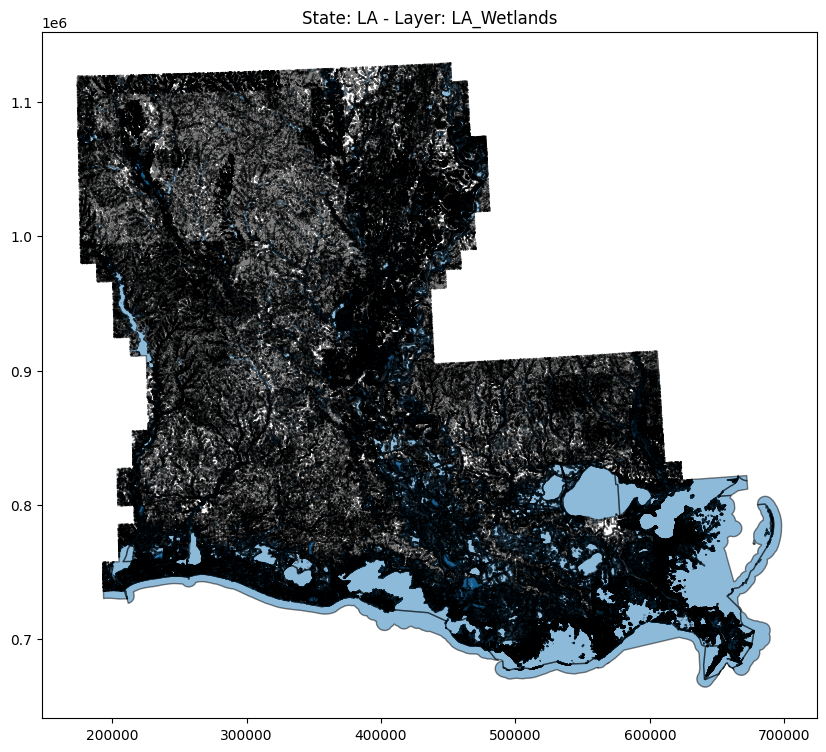

Checking path for MA: C:\Users\rubab\Desktop\GWE_codes\WetalandData\MA\MA_geodatabase_Wetlands.gdb


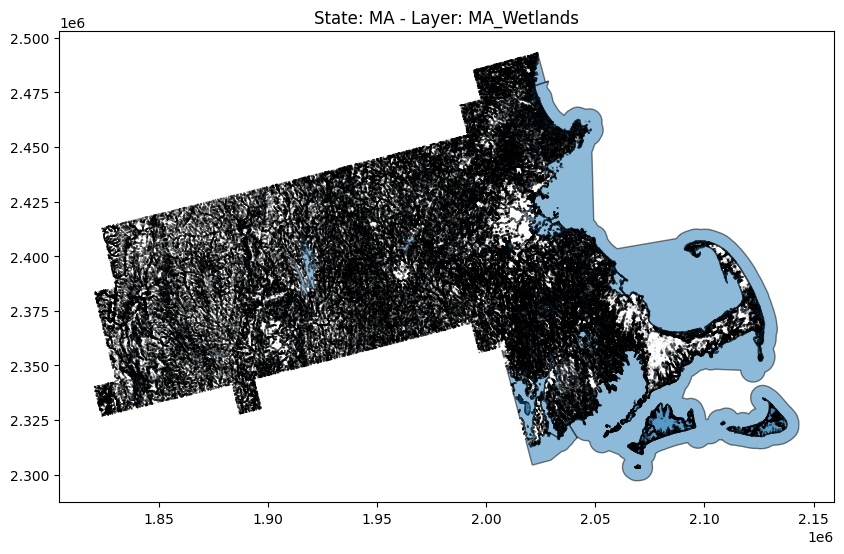

Checking path for MD: C:\Users\rubab\Desktop\GWE_codes\WetalandData\MD\MD_geodatabase_Wetlands.gdb


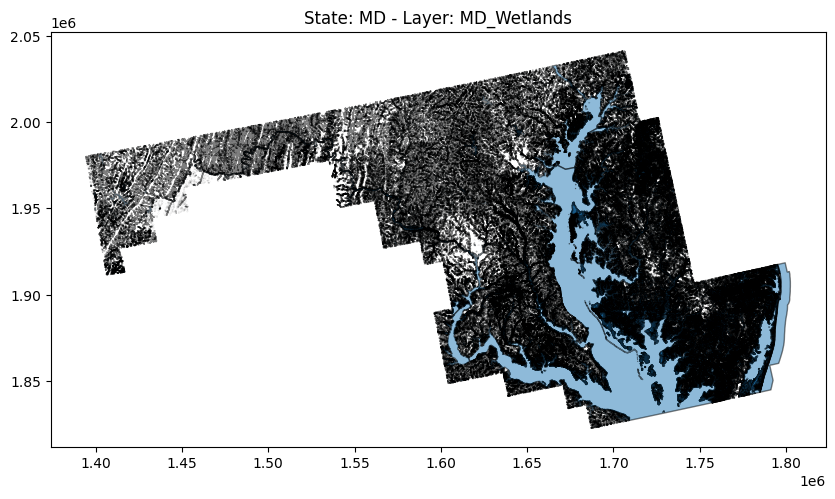

Checking path for ME: C:\Users\rubab\Desktop\GWE_codes\WetalandData\ME\ME_geodatabase_Wetlands.gdb


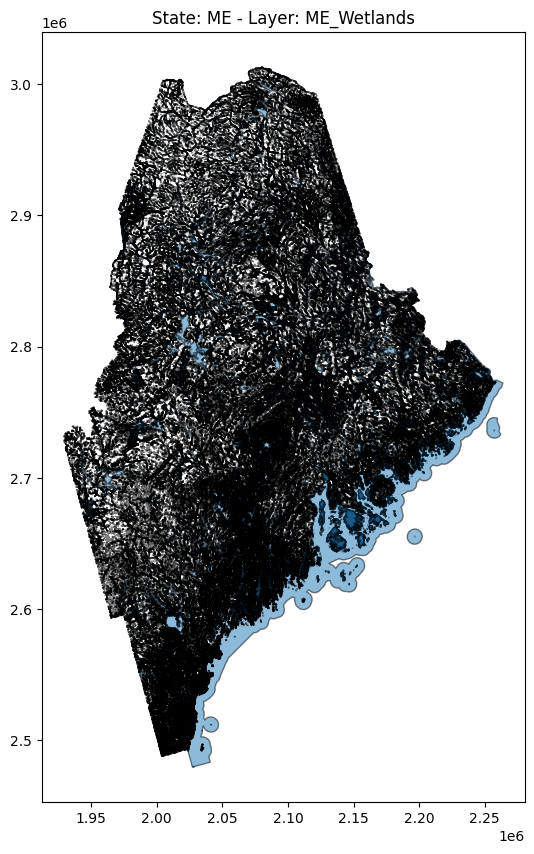

Checking path for MI: C:\Users\rubab\Desktop\GWE_codes\WetalandData\MI\MI_geodatabase_Wetlands.gdb


In [ ]:
import os
import geopandas as gpd
import matplotlib.pyplot as plt

# Set environment variable to skip organizing polygons
os.environ["OGR_ORGANIZE_POLYGONS"] = "SKIP"

# Corrected directory path containing the state-wise wetland folders
base_directory = r'C:\Users\rubab\Desktop\GWE_codes\WetalandData'

# Full list of state abbreviations
states = ['AL', 'AR','AZ','CO','CT','DC','DE','IA','ID','IL','IN','KS','KY','LA','MA','MD','ME','MI','MN','MO','MS','MT','ND','NE','NH','NJ','NM','NV','OH','OK','OR','PA','RI','SD','TN','UT','VT','WI','CA', 'TX', 'NY', 'FL', 'GA', 'NC', 'SC', 'VA', 'WA','WV','WY']  # Extend this list with all necessary state abbreviations

# Loop through each state to access and plot its wetland data
for state in states:
    # Path to each state's .gdb file inside its respective folder
    gdb_path = os.path.join(base_directory, state, f"{state}_geodatabase_Wetlands.gdb")
    
    # Print the path for debugging
    print(f"Checking path for {state}: {gdb_path}")
    
    # Layer name pattern
    layer_of_interest = f"{state}_Wetlands"
    
    try:
        # Check if the file exists
        if not os.path.exists(gdb_path):
            print(f"File does not exist: {gdb_path}")
            continue  # Skip to the next state
        
        # Read the specific layer for the state
        gdf = gpd.read_file(gdb_path, layer=layer_of_interest)
        
        # Plot the layer
        ax = gdf.plot(figsize=(10, 10), alpha=0.5, edgecolor='k')
        ax.set_title(f"State: {state} - Layer: {layer_of_interest}")
        plt.show()
    except Exception as e:
        print(f"Could not plot layer {layer_of_interest} for state {state}: {e}")




In [ ]:
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt

# Specify the path to your .tif file
tif_path = 'C:\Users\rubab\Desktop\GWE_codes\AncillaryWaterData\downloads_ancillary_downloadWaterData_PythonV3_2021/occurrence_0E_0Nv1_4_2021.tif'

# Open the TIFF file
with rasterio.open(tif_path) as src:
    # Display metadata
    print("Metadata:")
    print(src.meta)

    # Read the raster data
    data = src.read(1)  # Reads the first band

    # Display the shape and datatype
    print("\nData shape:", data.shape)
    print("Data type:", data.dtype)

    # Plot the raster data
    plt.figure(figsize=(10, 6))
    show(data, transform=src.transform, cmap='viridis')
    plt.title('Raster Data')
    plt.xlabel('X coordinate')
    plt.ylabel('Y coordinate')
    plt.colorbar(label='Pixel Value')
    plt.show()


In [ ]:
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt
from rasterio.enums import Resampling

# Specify the path to your .tif file
tif_path = 'C:/Users/rubab/Desktop/GWE_codes/AncillaryWaterData/downloads_ancillary_downloadWaterData_PythonV3_2021/occurrence_0E_0Nv1_4_2021.tif'

with rasterio.open(tif_path) as src:
    print("Metadata:")
    print(src.meta)

    # Downsample and read a subset for faster plotting
    data = src.read(1, out_shape=(int(src.height / 2), int(src.width / 2)), resampling=Resampling.bilinear)
    print("\nData shape:", data.shape)

    # Plotting with limited area for speed
    plt.figure(figsize=(10, 6))
    show(data, transform=src.transform, cmap='viridis', interpolation='nearest')
    plt.title('Downsampled Raster Data')
    plt.colorbar(label='Pixel Value')
    plt.show()
